## Preprocessing

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
import os
from skimage.feature import hog
import xgboost as xgb
from sklearn.metrics import accuracy_score

c:\Program Files\Python311\Lib\site-packages\keras\src\export\tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):


In [2]:
df = pd.read_csv('C:/Users/ziada/Desktop/AIS301 Machine Learning Project/Stock-vs-Modified-Classifier/Car_Images_metadata_fixed.csv')

In [3]:
df.head()

,image_path,label,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.7
1,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.7
2,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,77.7
3,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,77.7
4,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.7


In [4]:
df.shape

(3533, 11)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3533 entries, 0 to 3532
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image_path      3533 non-null   object 
 1   label           3533 non-null   int64  
 2   brand           3533 non-null   object 
 3   model           3533 non-null   object 
 4   year            3533 non-null   int64  
 5   filename        3533 non-null   object 
 6   L_real_m        3533 non-null   float64
 7   W_real_m        3533 non-null   float64
 8   H_real_m        3533 non-null   float64
 9   WB_real_m       3533 non-null   float64
 10  Noise_Level_dB  3533 non-null   float64
dtypes: float64(5), int64(2), object(4)
memory usage: 303.7+ KB


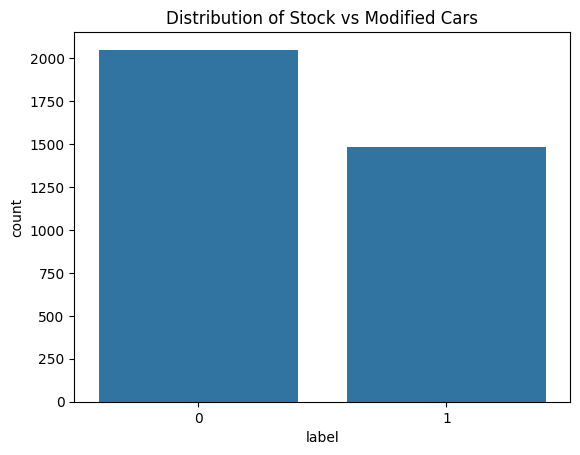

In [6]:
sns.countplot(x='label', data=df)
plt.title('Distribution of Stock vs Modified Cars')
plt.show()

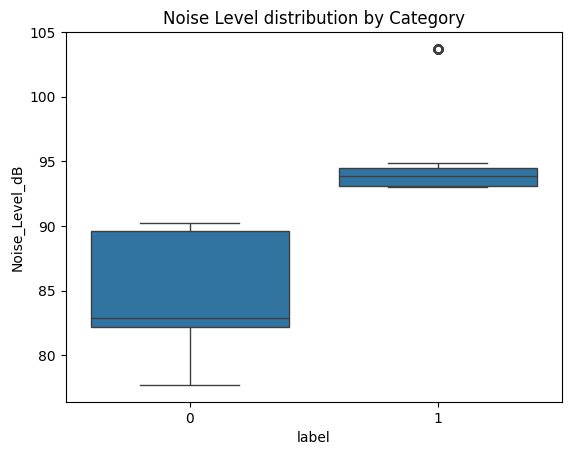

In [7]:
sns.boxplot(x='label', y='Noise_Level_dB', data=df)
plt.title('Noise Level distribution by Category')
plt.show()

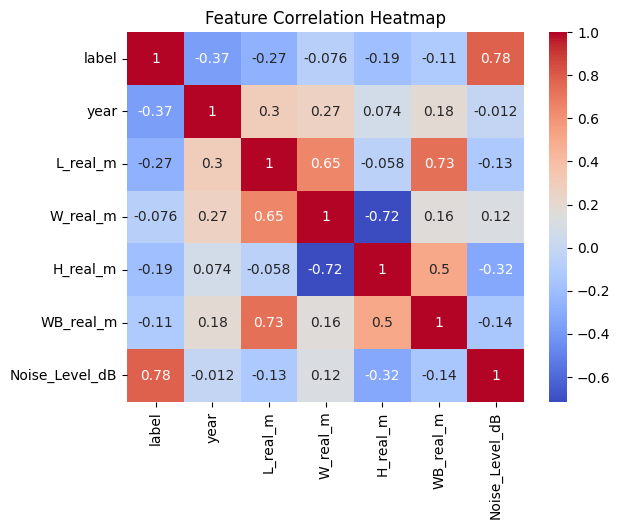

In [8]:
sns.heatmap(df.select_dtypes(include=['number']).corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Heatmap')
plt.show()

In [9]:
df.head()

,image_path,label,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.7
1,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.7
2,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,77.7
3,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,77.7
4,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.7


In [10]:
X = df.drop("label", axis=1)
Y = df.label

In [11]:
X.head()


,image_path,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.7
1,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.7
2,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,77.7
3,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,77.7
4,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.7


In [12]:
Y.head()

0    0
1    0
2    0
3    0
4    0
Name: label, dtype: int64

In [13]:
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), ['brand', 'model']),
        ('num', StandardScaler(), ['year', 'L_real_m', 'W_real_m', 'H_real_m', 'WB_real_m', 'Noise_Level_dB'])
    ])

In [14]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [15]:
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

In [16]:
base_dir = r"C:\Users\ziada\Desktop\AIS301 Machine Learning Project\Stock-vs-Modified-Classifier"

images = []
for path in df['image_path']:
    full_path = os.path.join(base_dir, path)
    img = cv2.imread(full_path)
    img = cv2.resize(img, (224, 224)) # Resize Image
    images.append(img)
# images = np.array(images) / 255.0  # Normalize Image (Not needed for feature extraction)
y = df['label'].values

In [17]:
X_train_img, X_test_img, Y_train, Y_test = train_test_split(images, Y, test_size=0.2, random_state=42)

In [18]:
#Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)
datagen.fit(X_train_img)

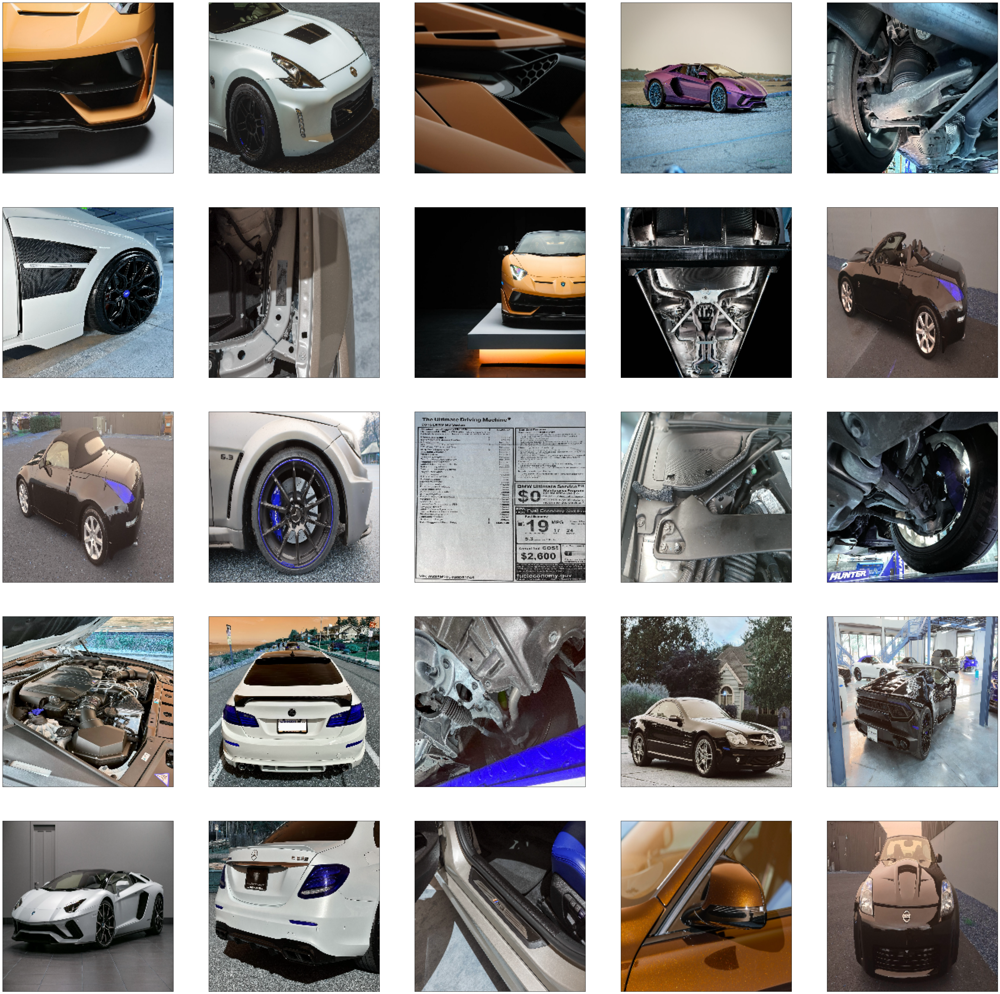

In [19]:
#some examples of the data
plt.figure(figsize=(50, 50))
for i in range(25):    
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_train_img[i], cmap=plt.cm.binary)  
plt.show()

## Image Training & Testing

In [20]:
def extract_combined_features(images_array):
    combined_features = []
    for img in images_array:
        
        # Histogram of Gradient (HOG)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        shape_feat = hog(gray, orientations=9, pixels_per_cell=(16, 16), #9 bins in histogram of Orientation
                         cells_per_block=(2, 2), visualize=False) #block L2 normalization default
        
        # HSV Histogram
        hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        # Hue (color) and Saturation (intensity)
        # 8 bins for Hue, 8 bins for Saturation = 64 color features
        hist_h = cv2.calcHist([hsv], [0], None, [8], [0, 180]).flatten() #Hue Range 0 -> 179
        hist_s = cv2.calcHist([hsv], [1], None, [8], [0, 256]).flatten() #Sat Range 0 -> 255
        
        # Normalize histograms to similar to HOG
        hist_h = hist_h / (np.sum(hist_h) + 1e-7)
        hist_s = hist_s / (np.sum(hist_s) + 1e-7)
        
        # Stack the shape, hue, saturation features together
        combined_feat = np.hstack([shape_feat, hist_h, hist_s])
        combined_features.append(combined_feat)
        
    return np.array(combined_features)

# Extract features
X_train_img_feats = extract_combined_features(X_train_img)
X_test_img_feats = extract_combined_features(X_test_img)

In [21]:
xgb_image_model = xgb.XGBClassifier(n_estimators=200, learning_rate=0.05, max_depth=6, use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_image_model.fit(X_train_img_feats, Y_train)

image_pred = xgb_image_model.predict(X_test_img_feats)

print(accuracy_score(Y_test, image_pred))

c:\Program Files\Python311\Lib\site-packages\xgboost\training.py:199: UserWarning: [04:10:51] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


0.7779349363507779


## Text Training & Testing

In [22]:
xgb_tab_model = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_tab_model.fit(X_train, Y_train)

tab_pred = xgb_tab_model.predict(X_test)

print(accuracy_score(Y_test, tab_pred))


1.0


c:\Program Files\Python311\Lib\site-packages\xgboost\training.py:199: UserWarning: [04:11:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


## Late Fusion

In [29]:
prob_tab = xgb_tab_model.predict_proba(X_test)[:, 1]
prob_img = xgb_image_model.predict_proba(X_test_img_feats)[:, 1]

final_prob = (prob_tab + prob_img) / 2

final_pred = []
for i in range(len(final_prob)):
    if final_prob[i] > 0.5:
        final_pred.append(1)
    else:
        final_pred.append(0)

print("Final Multi-Modal Fusion Accuracy: ", accuracy_score(Y_test, final_pred))

Final Multi-Modal Fusion Accuracy:  1.0
